## Khai báo các thư viện cần thiết

In [1]:
!pip install -q segmentation_models

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.5 MB/s eta 0:00:00


In [2]:
import sys
import importlib.util
import shutil

sys.path.append('/kaggle/input/python-code')

def import_module_from_path(name, path):
    spec = importlib.util.spec_from_file_location(name, path)
    mod = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(mod)
    return mod

In [3]:
preprocessing = import_module_from_path("preprocessing", "/kaggle/input/python-code/preprocessing.py")
utils = import_module_from_path("utils", "/kaggle/input/python-code/utils.py")
load_datasets = import_module_from_path("load_datasets", "/kaggle/input/python-code/load_datasets.py")

Segmentation Models: using `tf.keras` framework.


In [4]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

import segmentation_models as sm

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

## Trực quan phần tiền xử lý với ảnh đầu vào

In [5]:
img = cv2.imread('/kaggle/input/brain-tumor-segmentation-ds/images/100.png')

### Tăng độ sắc nét

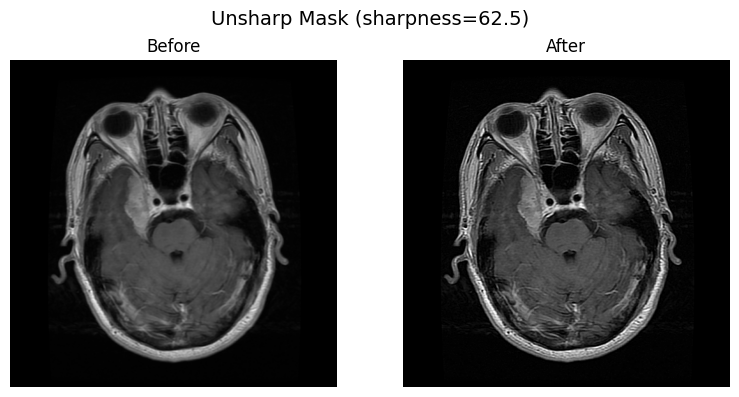

In [6]:
img = preprocessing.unsharp_mask(img, plot=True, strength=3.0, sharpness_thresh=80)

### Tăng độ sáng

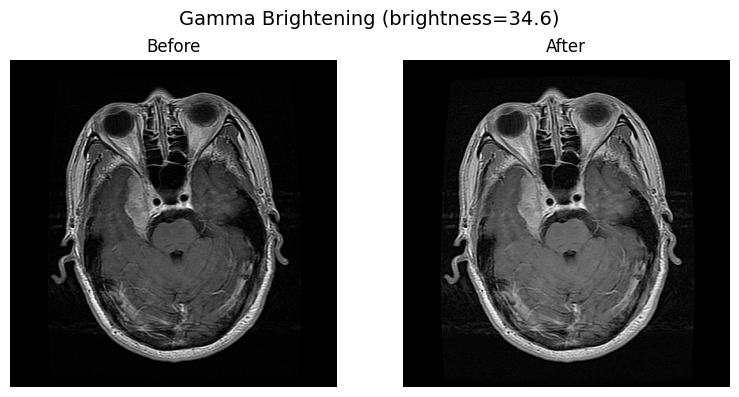

In [7]:
img = preprocessing.brighten_if_dark(img, plot=True, brightness_thresh=40)

### Tăng độ tương phản

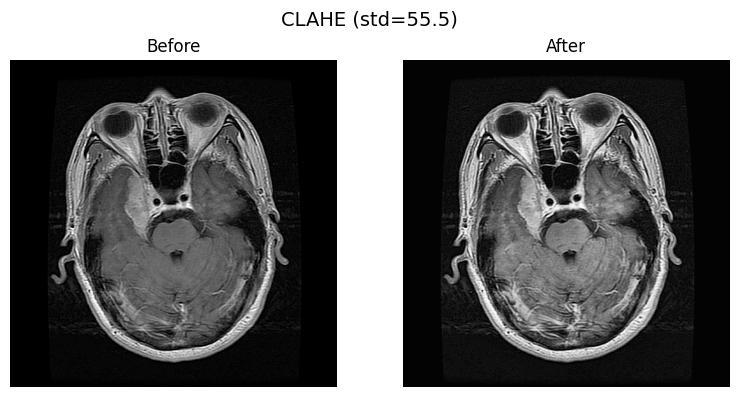

In [8]:
img = preprocessing.apply_soft_clahe(img, plot=True, std_thresh=60)

### Loại bỏ các nhiễu nhỏ ngoài vùng hộp sọ

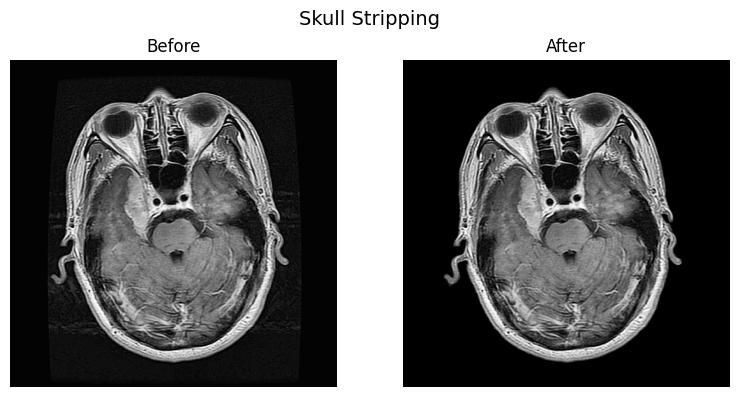

In [9]:
img = preprocessing.skull_strip(img, plot=True, thresh_blur=30)

## Tiền xử lý cho ảnh đầu vào

In [ ]:
image_dir = '/kaggle/input/brain-tumor-segmentation-ds/images'
mask_dir = '/kaggle/input/brain-tumor-segmentation-ds/masks'

out_image_dir = '/kaggle/working/dataset_segment_pre'

preprocessing.process_and_save_images_and_masks_segmentation(image_dir, mask_dir, out_image_dir, brightness_thresh=40, std_thresh=60, sharpness_thresh=80, thresh_blur=30, strength=3.0)

Processing: 100%|██████████| 5165/5165 [02:45<00:00, 31.13it/s]


## Đọc và phân chia tập dữ liệu đầu vào

In [11]:
train_df, test_df, valid_df, train_ds, valid_ds, test_ds = load_datasets.load_datasets_segmentation(out_image_dir, batch_size=32)

Train samples: 3615, Validation samples: 516, Test samples: 1034


## Trực quan số lượng mẫu trên từng tập dữ liệu

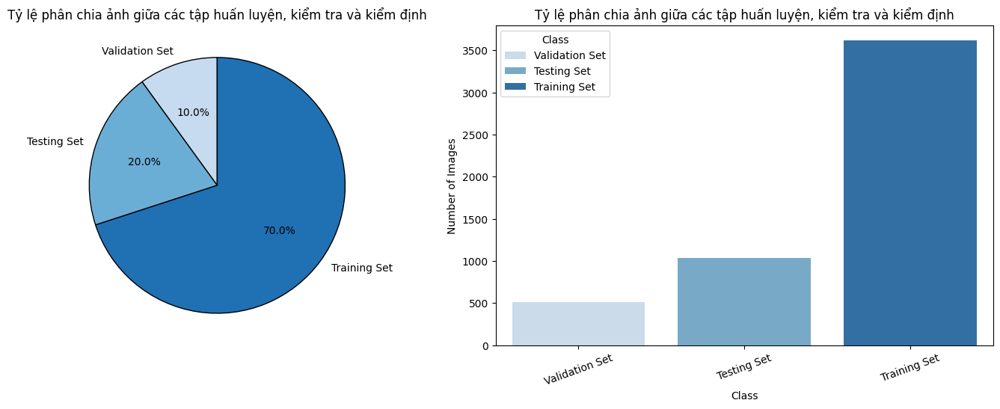

In [12]:
df_split = pd.DataFrame({
    "Class": ["Training Set", "Testing Set", "Validation Set"],
    "Count": [len(train_df), len(test_df), len(valid_df)]
})

utils.plot_distribution(df_split, title="Tỷ lệ phân chia ảnh giữa các tập huấn luyện, kiểm tra và kiểm định", palette_name="Blues", x_col="Class", hue_col="Class")

## Trực quan một số mẫu trong tập dữ liệu

In [13]:
def show_images(images, masks):
    plt.figure(figsize=(12, 12))
    for i in range(25):
        plt.subplot(5, 5, i+1)
        img_path = images[i]
        mask_path = masks[i]

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(mask_path)

        plt.imshow(image)
        plt.imshow(mask, alpha=0.4)

        plt.axis('off')

    plt.tight_layout()
    plt.show()

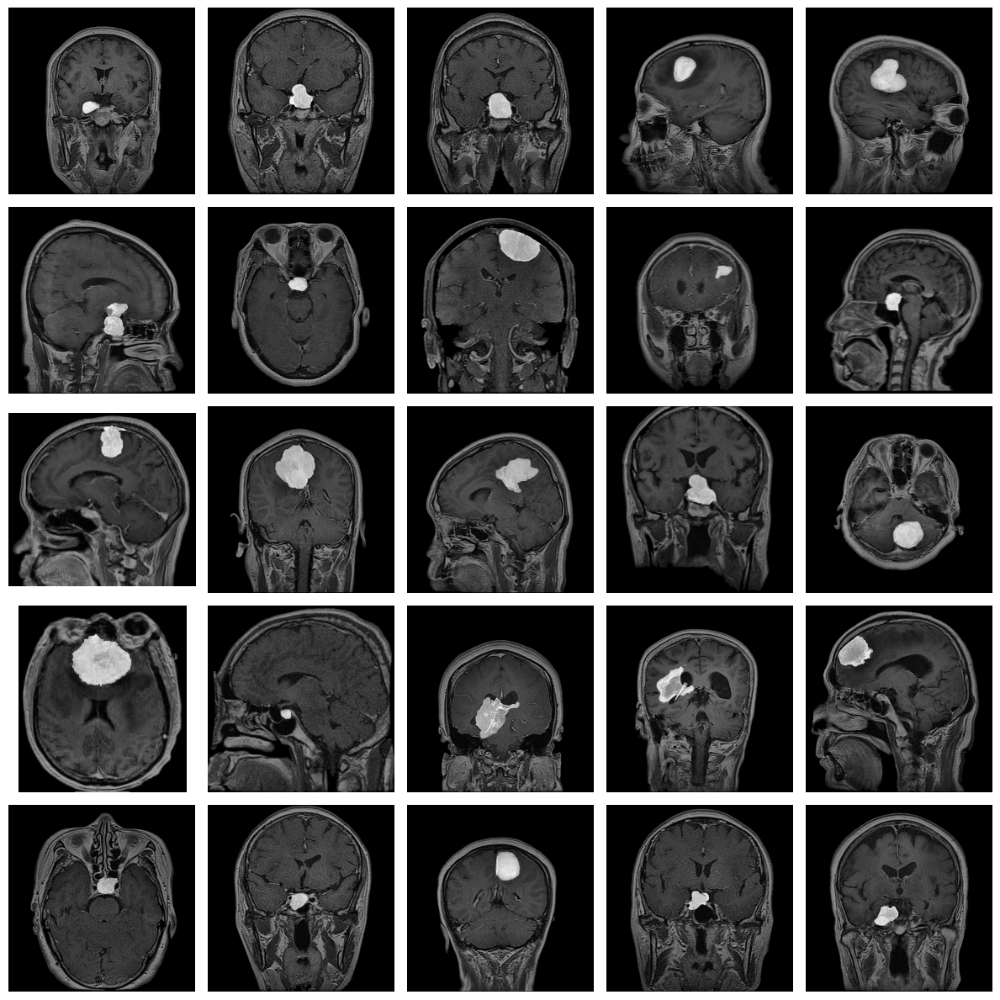

In [14]:
show_images(list(train_df['image_paths']), list(train_df['mask_paths']))

## Các độ đo đánh giá mô hình

In [15]:
smooth = 1

def tversky(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    beta = 1 - alpha
    return (true_pos + smooth)/(true_pos + alpha*false_neg + beta*false_pos + smooth)

def focal_tversky(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

## Khai báo mô hình và các tham số huấn luyện

In [16]:
model = sm.Unet(
    backbone_name='efficientnetb0',
    encoder_weights='imagenet',
    input_shape=(256, 256, 3),
    classes=1,
    activation='sigmoid'
)

16804768/16804768 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [17]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 128, 128, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 128, 128, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 128, 128, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 128, 128, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 128, 128, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 128, 128, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand         │ (None, 1, 1, 32)       │            288 │ block1a_se_reduce[0][… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_excite         │ (None, 128, 128, 32)   │              0 │ block1a_activation[0]… │
│ (Multiply)                │                        │                │ block1a_se_expand[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_conv      │ (None, 128, 128, 16)   │            512 │ block1a_se_excite[0][… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_bn        │ (None, 128, 128, 16)   │             64 │ block1a_project_conv[… │
│ (BatchNormalization) 

 Total params: 10,115,501 (38.59 MB)

 Trainable params: 10,071,501 (38.42 MB)

 Non-trainable params: 44,000 (171.88 KB)

In [18]:
optimizer = tf.keras.optimizers.Adamax(learning_rate=0.001)

model.compile(
    optimizer=optimizer,
    loss=tversky_loss,
    metrics=[tversky, sm.metrics.IOUScore(threshold=0.5)]
)


early_stop = EarlyStopping(
    monitor='val_tversky',
    patience=15,
    verbose=1,
    mode='max',
    restore_best_weights=True
)

checkpoint = ModelCheckpoint(
    'model_save/best_model_seg.keras',
    monitor='val_tversky',
    verbose=0,
    save_best_only=True,
    mode='max'
)

lr_reduce = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.7,
    patience=10,
    verbose=0,
    mode='min',
    min_lr=1e-4
)

callbacks = [early_stop, checkpoint, lr_reduce]

## Huấn luyện mô hình với tập dữ liệu

In [19]:
history = model.fit(train_ds,
                    epochs=60,
                    verbose=1,
                    callbacks=callbacks,
                    validation_data = valid_ds)

Epoch 1/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 190s 899ms/step - iou_score: 0.2555 - loss: 0.7093 - tversky: 0.2907 - val_iou_score: 0.6537 - val_loss: 0.4846 - val_tversky: 0.5207 - learning_rate: 0.0010
Epoch 2/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 39s 320ms/step - iou_score: 0.7304 - loss: 0.1575 - tversky: 0.8425 - val_iou_score: 0.7276 - val_loss: 0.1822 - val_tversky: 0.8206 - learning_rate: 0.0010
Epoch 3/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 39s 320ms/step - iou_score: 0.7875 - loss: 0.1092 - tversky: 0.8908 - val_iou_score: 0.7484 - val_loss: 0.1751 - val_tversky: 0.8298 - learning_rate: 0.0010
Epoch 4/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 40s 326ms/step - iou_score: 0.8057 - loss: 0.0951 - tversky: 0.9049 - val_iou_score: 0.7535 - val_loss: 0.1342 - val_tversky: 0.8682 - learning_rate: 0.0010
Epoch 5/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 38s 309ms/step - iou_score: 0.8224 - loss: 0.0830 - tversky: 0.9170 - val_iou_score: 0.7852 - val_loss: 0.1438 - val_tversky: 0.8595 - learning_rate: 0.0010
Epoch 6/60
113

## Trực quan một số độ đo đánh giá mô hình trong quá trình huấn luyện

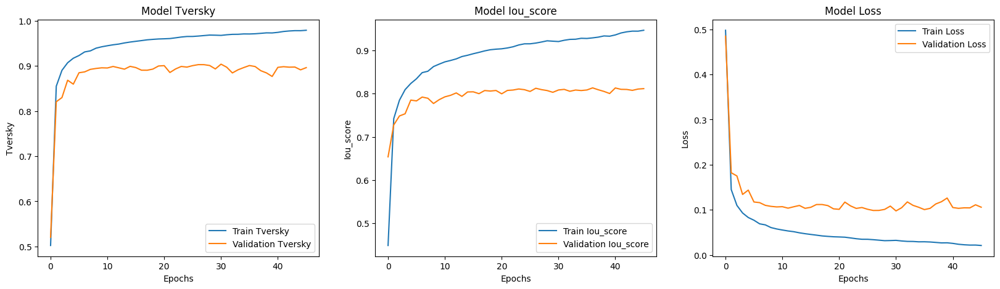

In [20]:
plt.figure(figsize=(20, 5))

plt.subplot(1, 3, 1)
plt.plot(history.history['tversky'], label='Train Tversky')
plt.plot(history.history['val_tversky'], label='Validation Tversky')
plt.xlabel('Epochs')
plt.ylabel('Tversky')
plt.legend()
plt.title('Model Tversky')

plt.subplot(1, 3, 2)
plt.plot(history.history['iou_score'], label='Train Iou_score')
plt.plot(history.history['val_iou_score'], label='Validation Iou_score')
plt.xlabel('Epochs')
plt.ylabel('Iou_score')
plt.legend()
plt.title('Model Iou_score')

plt.subplot(1, 3, 3)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Model Loss')

plt.show()

## Load lên model check_point để dự đoán cho tập kiểm tra

In [21]:
checkpoint_path = "model_save/best_model_seg.keras"
model.load_weights(checkpoint_path)

In [22]:
test_score = model.evaluate(test_ds, verbose= 1)

print("Test Loss: ", test_score[0])
print("Test Tversky: ", test_score[1])
print("Test IOU: ", test_score[2])

33/33 ━━━━━━━━━━━━━━━━━━━━ 11s 337ms/step - iou_score: 0.8156 - loss: 0.0917 - tversky: 0.9084
Test Loss:  0.09639765322208405
Test Tversky:  0.9037642478942871
Test IOU:  0.8037936091423035


## In ra một số độ đo đánh giá mô hình trên tập kiểm tra

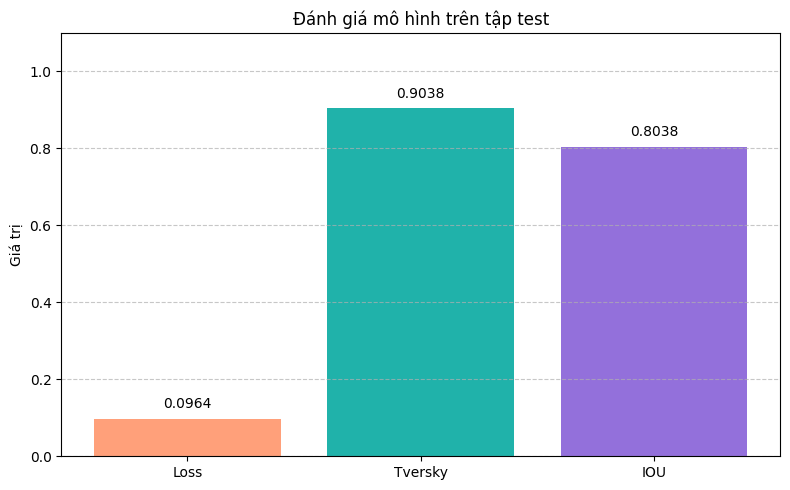

In [23]:
metrics = ["Loss", "Tversky", "IOU"]
values = test_score

plt.figure(figsize=(8, 5))
bars = plt.bar(metrics, values, color=["#FFA07A", "#20B2AA", "#9370DB"])
plt.title("Đánh giá mô hình trên tập test")
plt.ylabel("Giá trị")
plt.ylim(0, 1.1)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, height + 0.02, f"{height:.4f}", ha='center', va='bottom')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## Trực quan một số dự đoán của mô hình trên tập kiểm tra

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


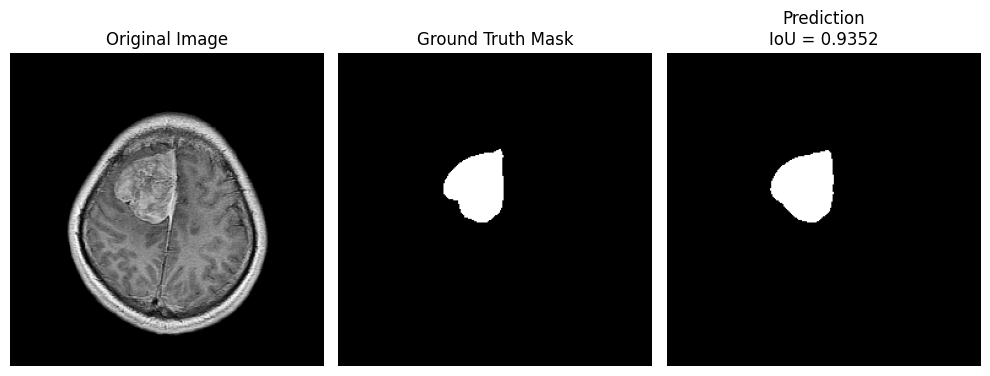

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


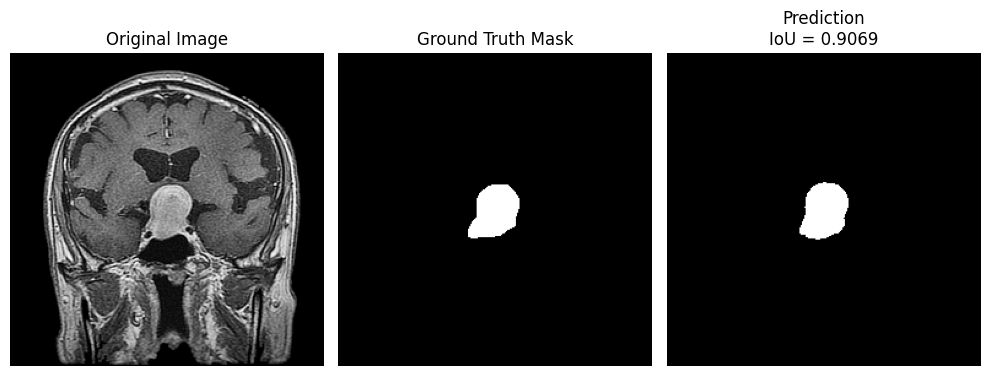

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


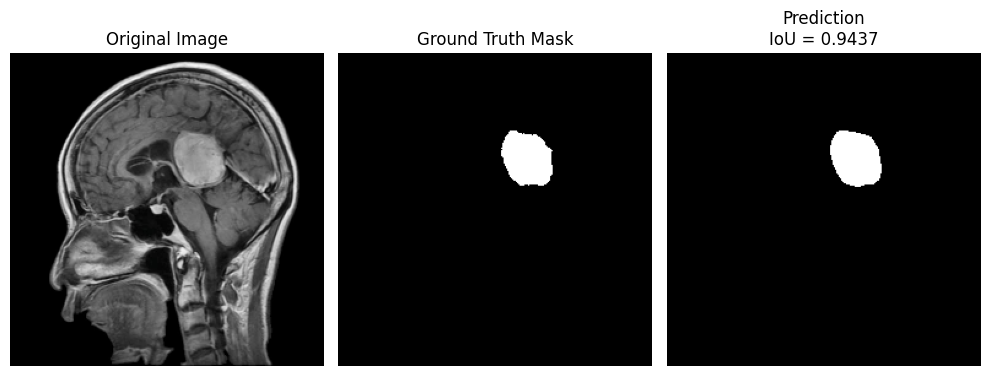

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


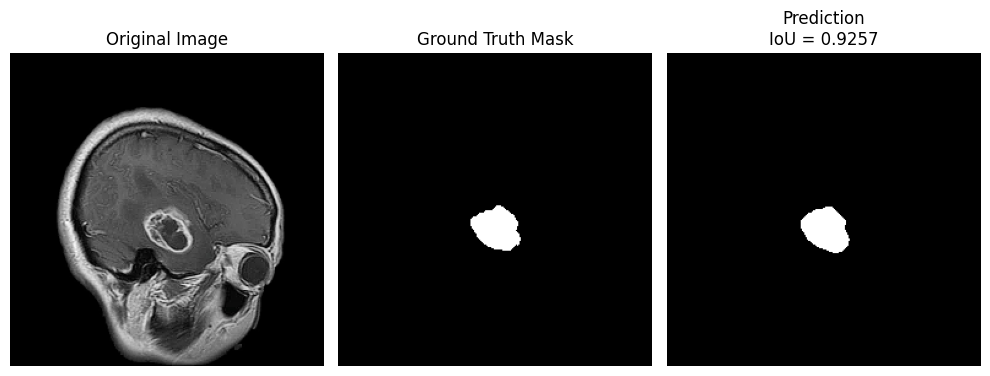

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


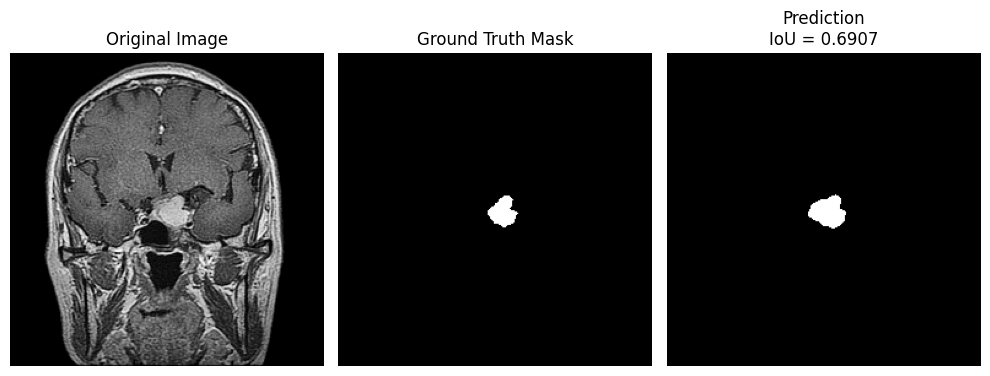

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


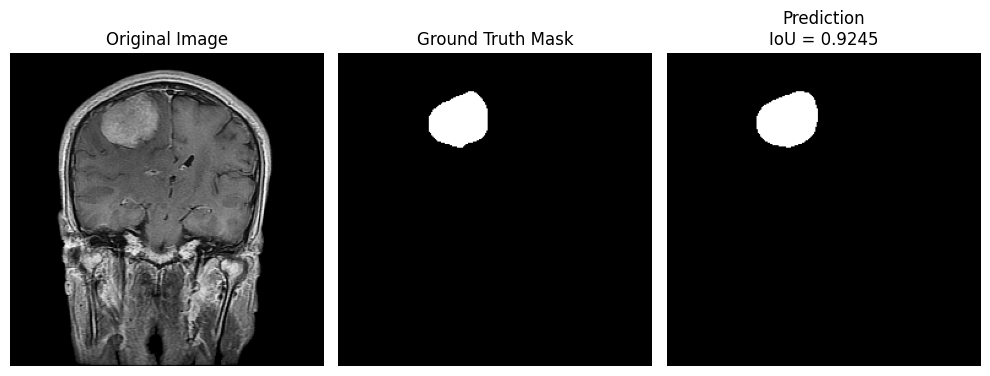

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


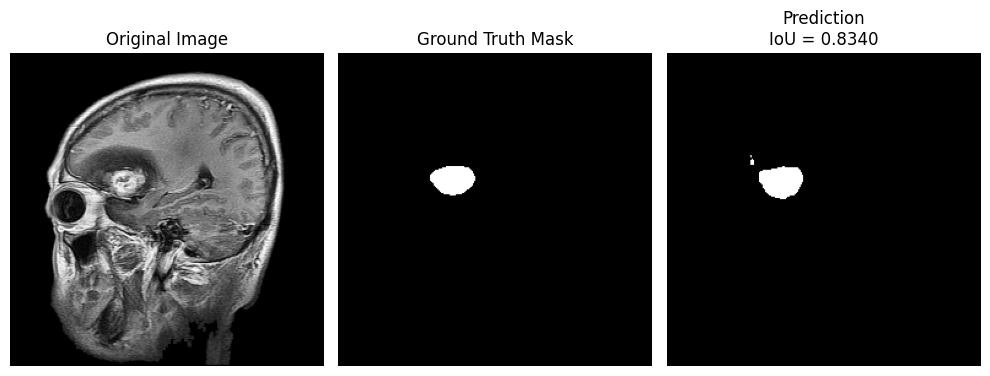

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


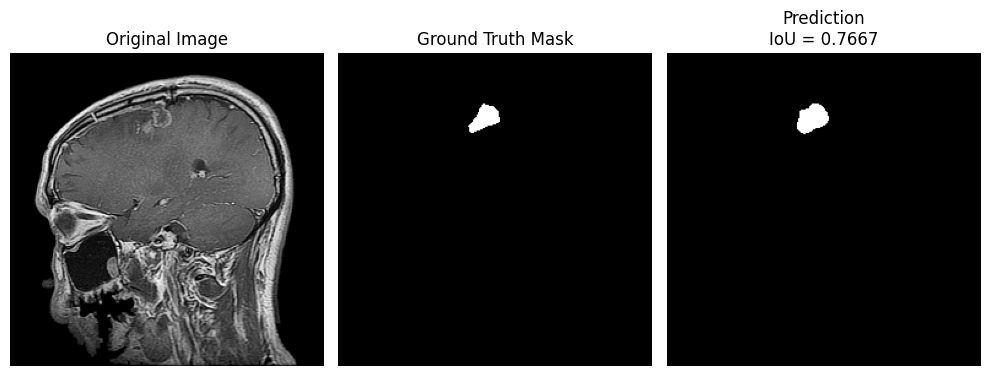

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


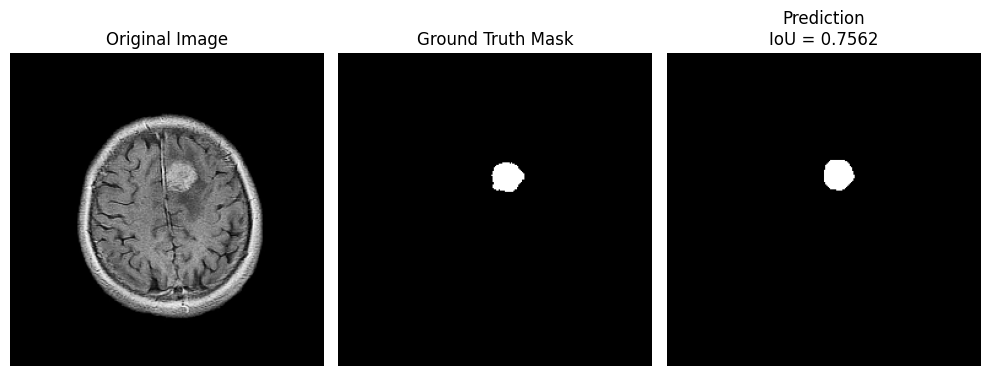

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


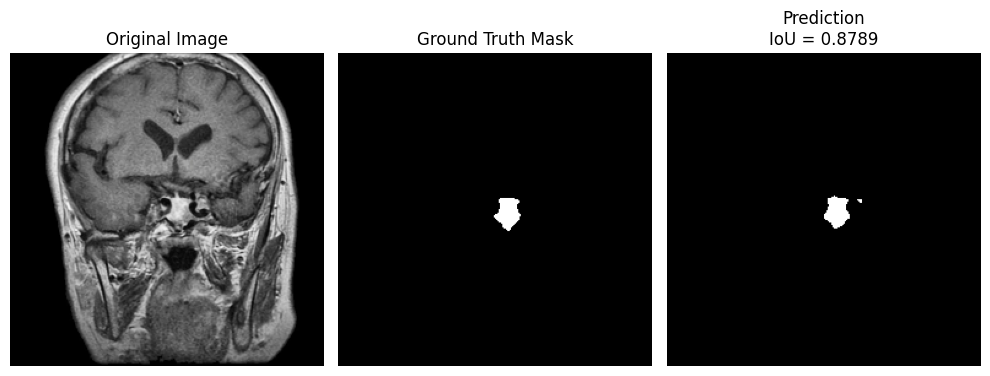

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


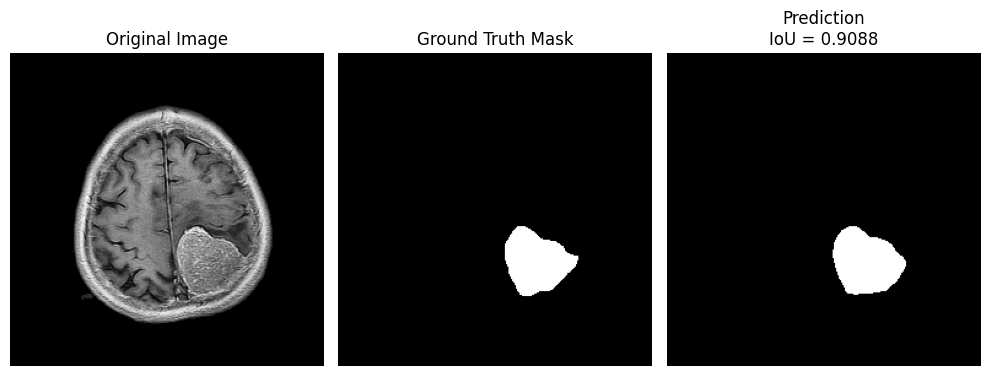

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


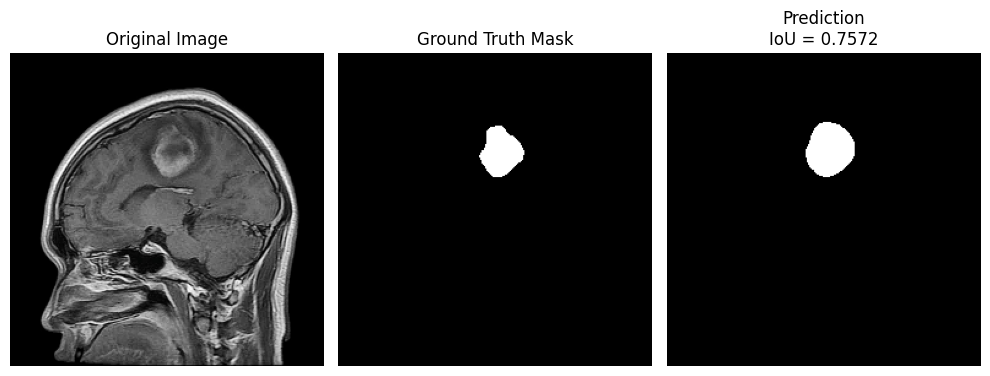

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


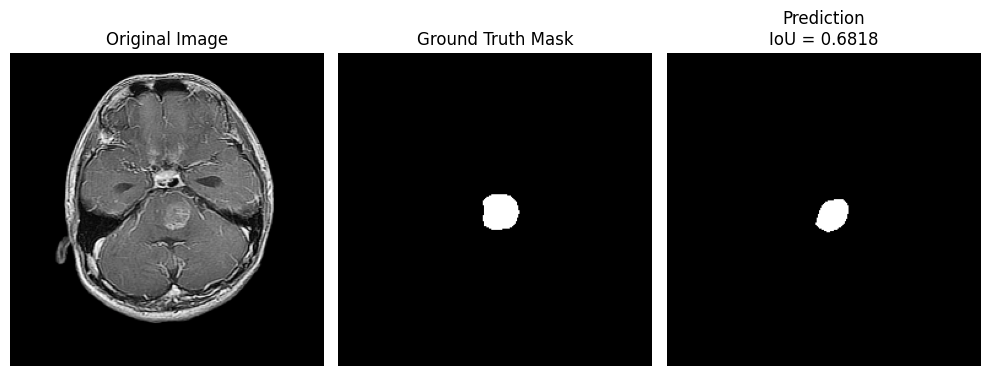

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


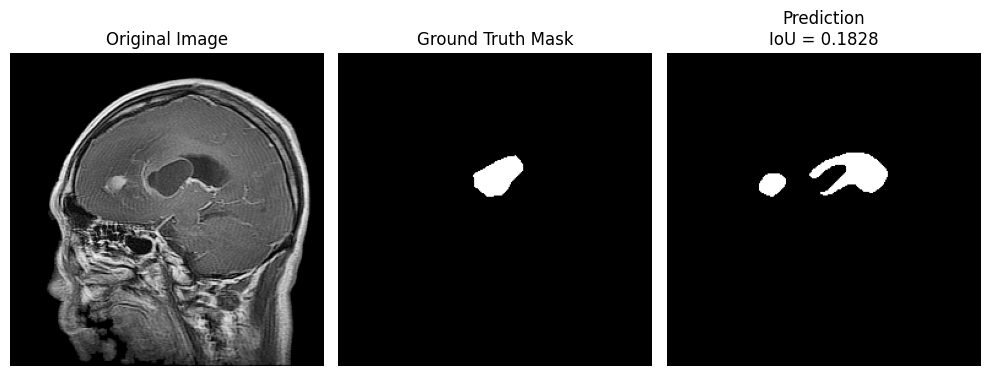

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


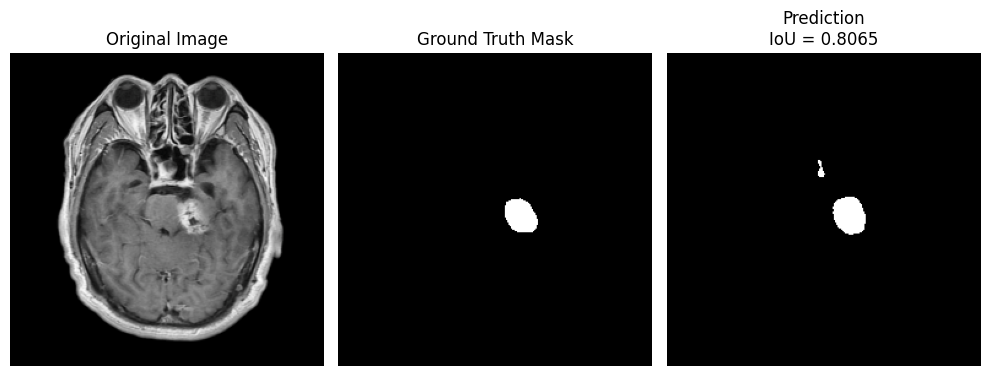

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


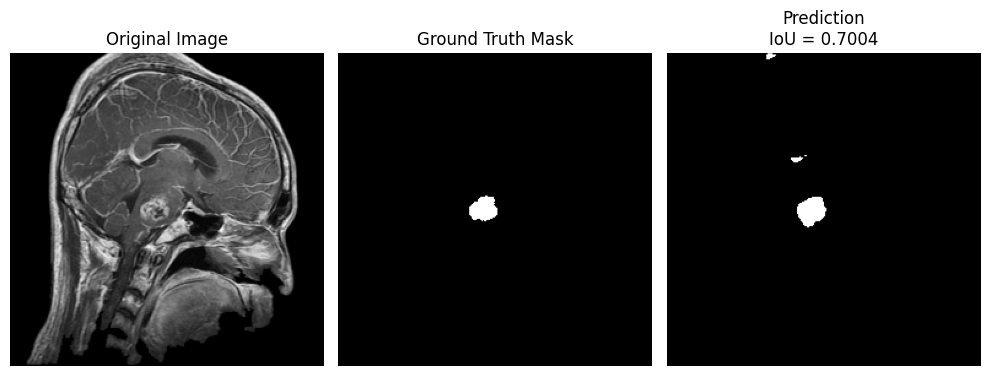

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


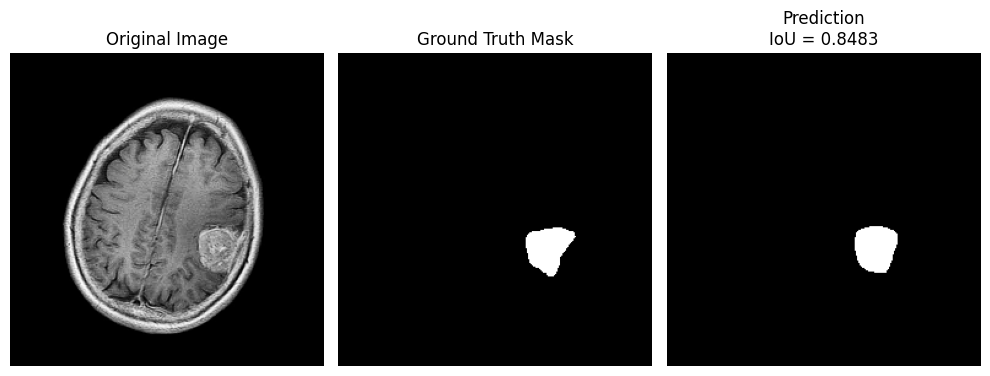

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


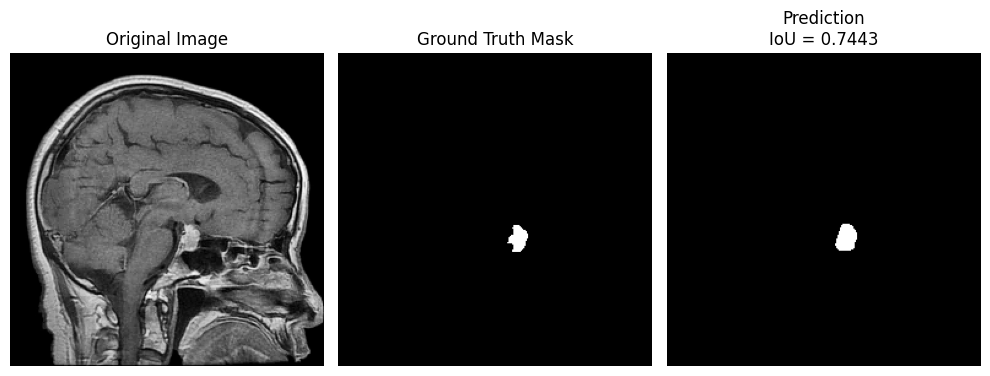

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


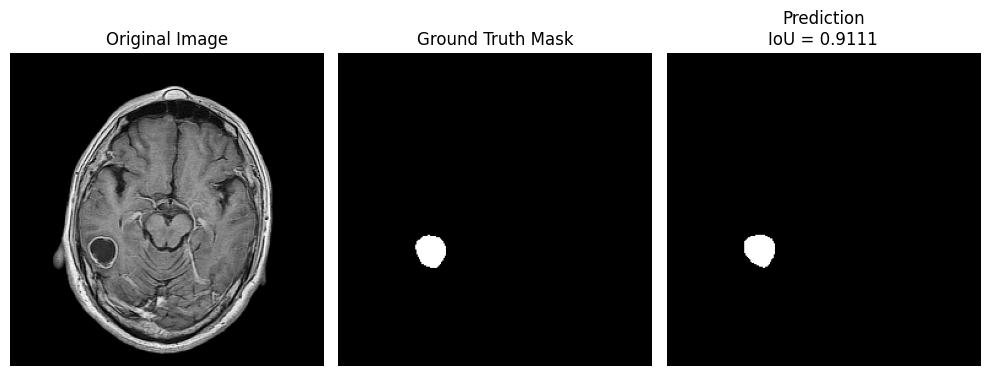

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


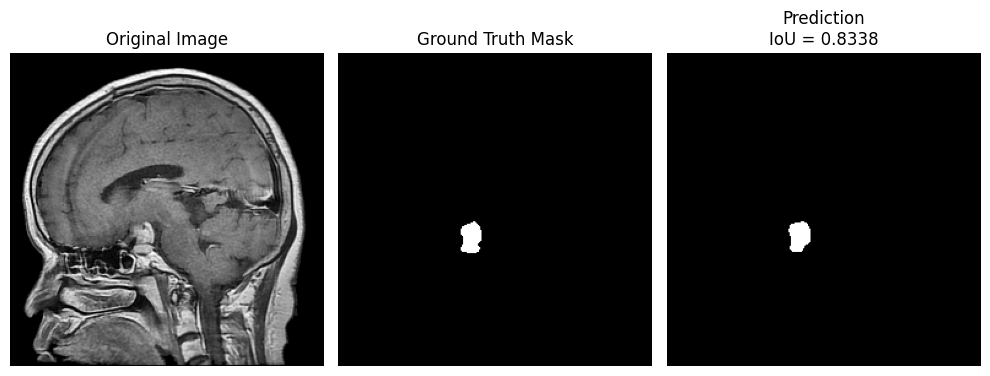

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


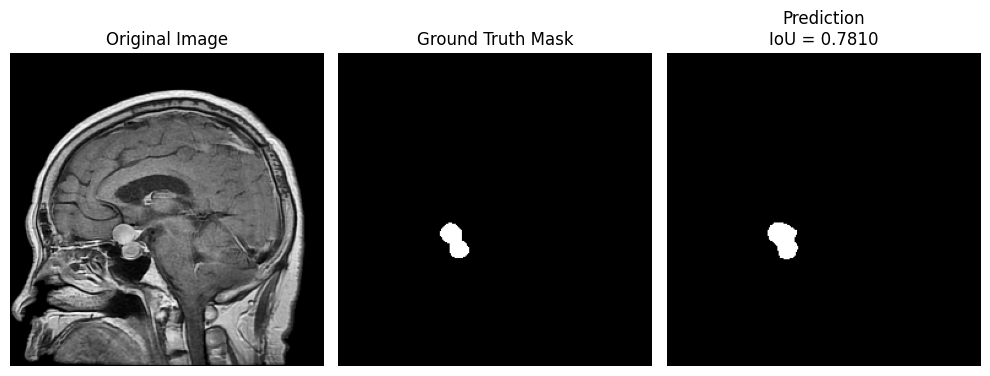

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


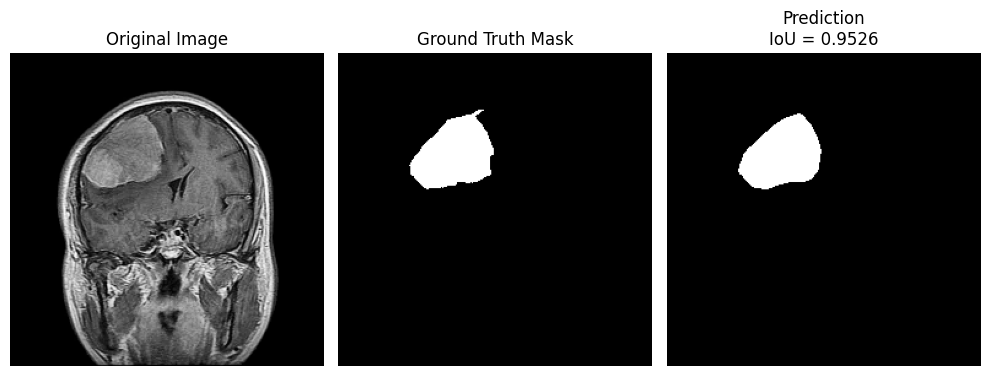

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


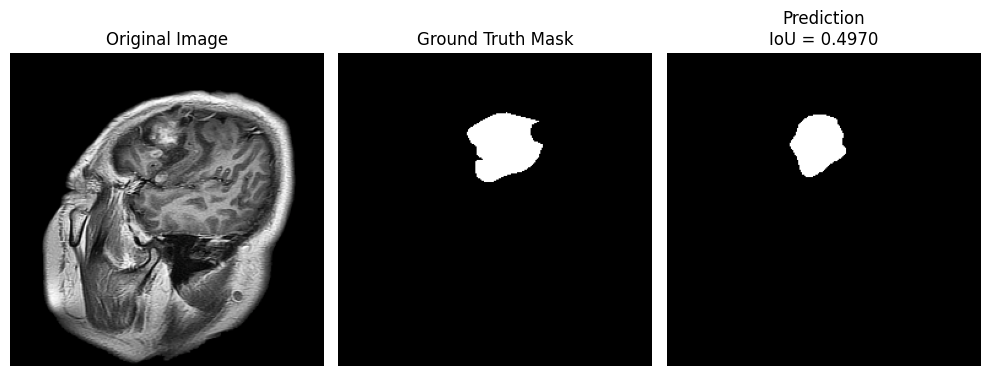

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


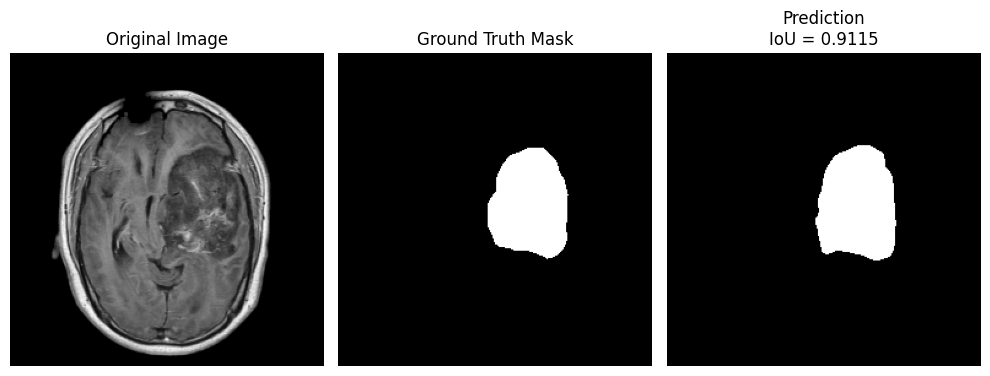

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


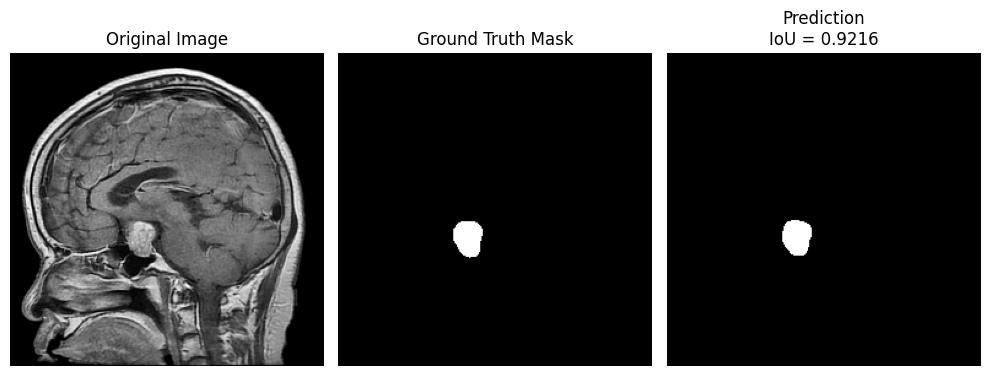

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


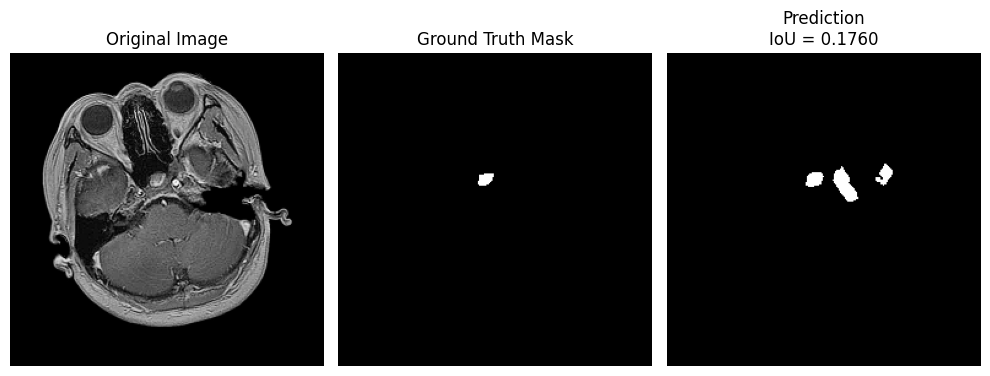

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


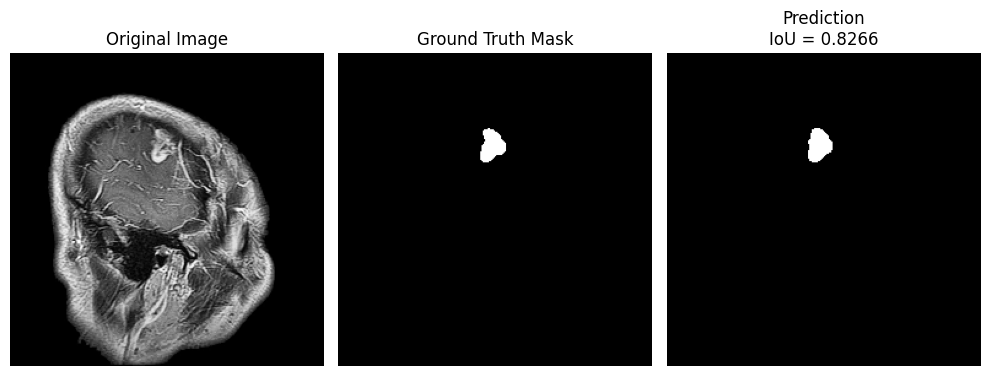

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


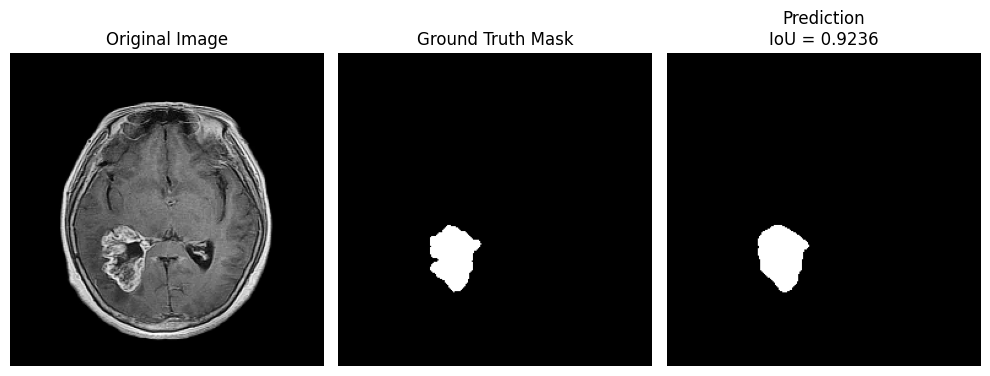

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


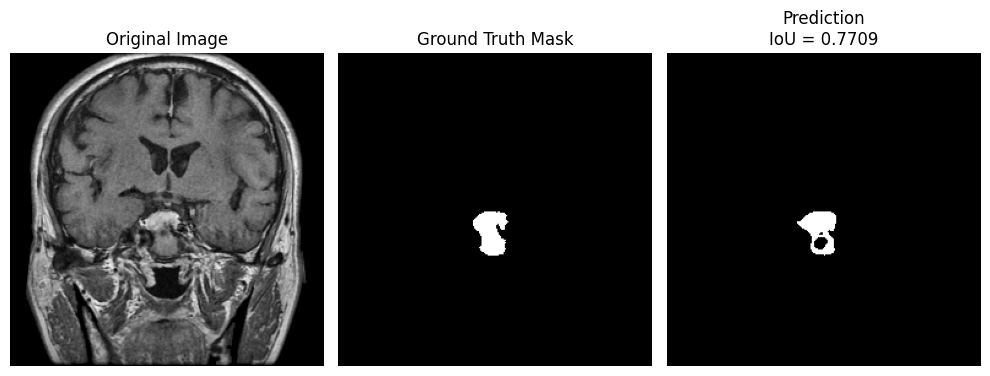

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


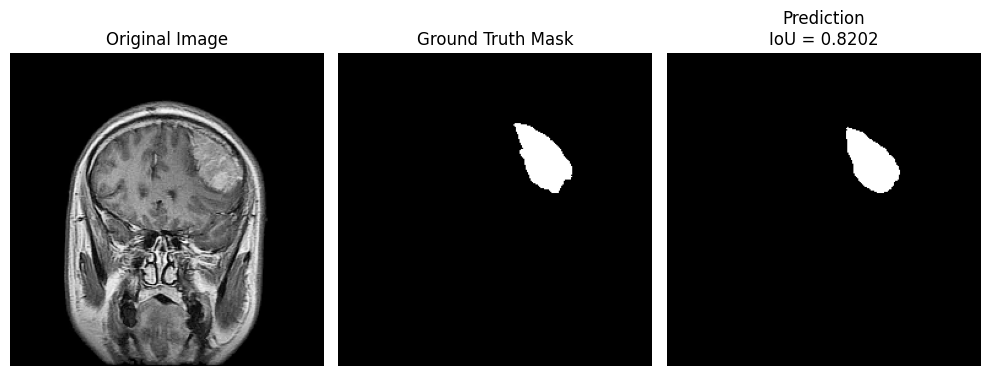

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


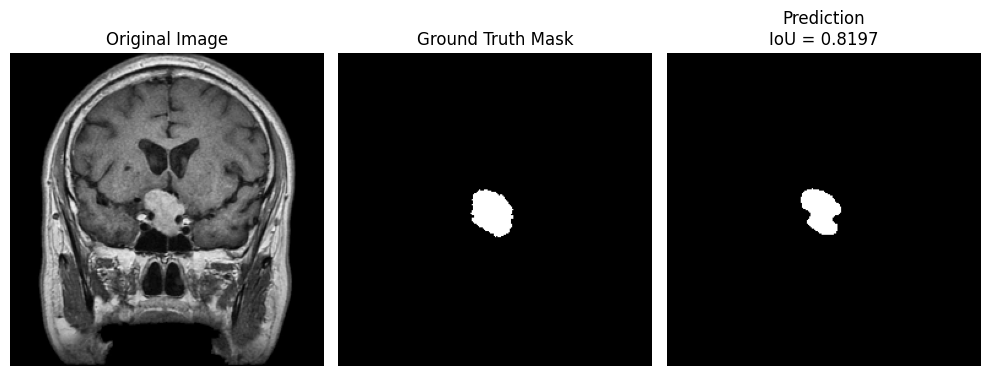

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


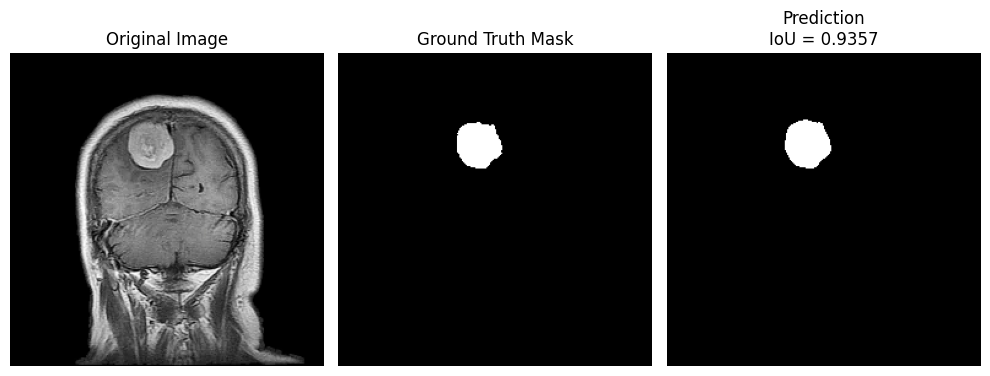

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


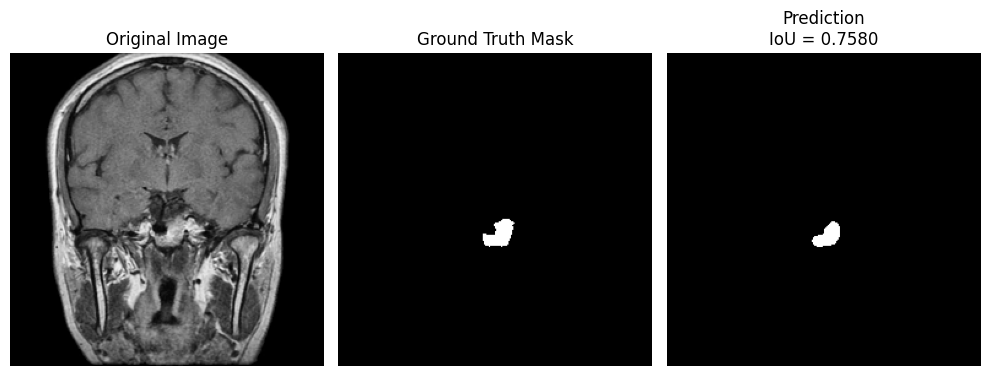

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


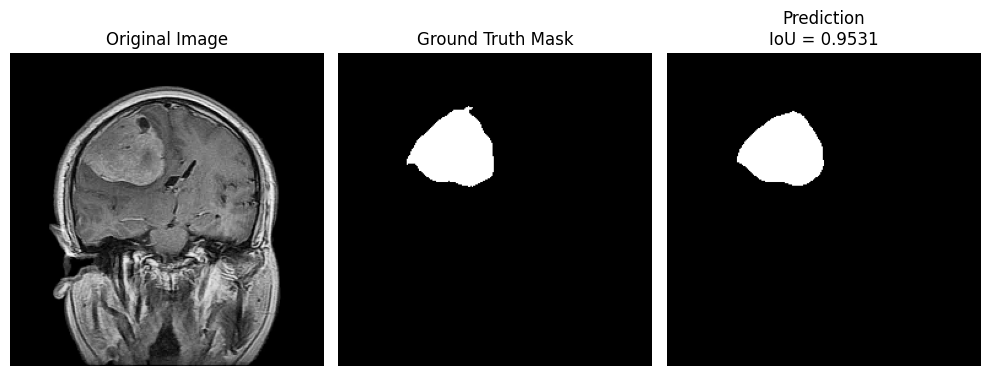

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


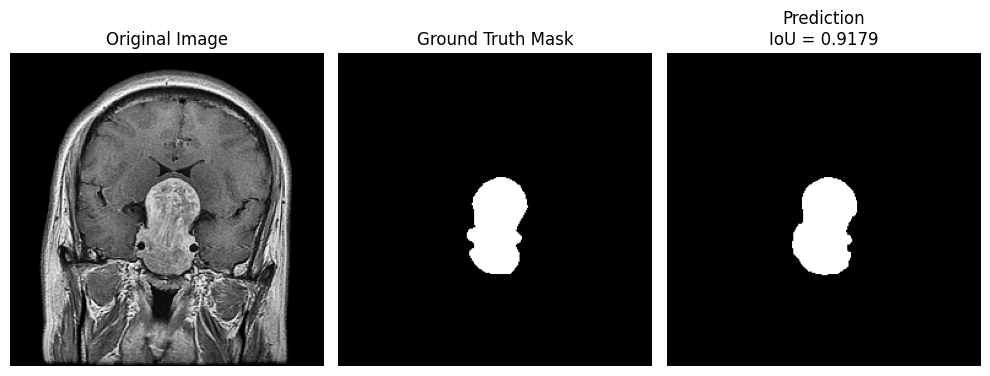

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


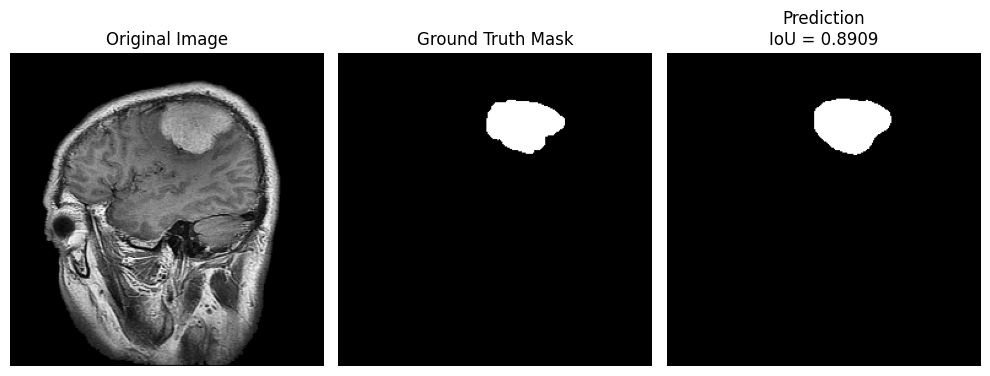

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


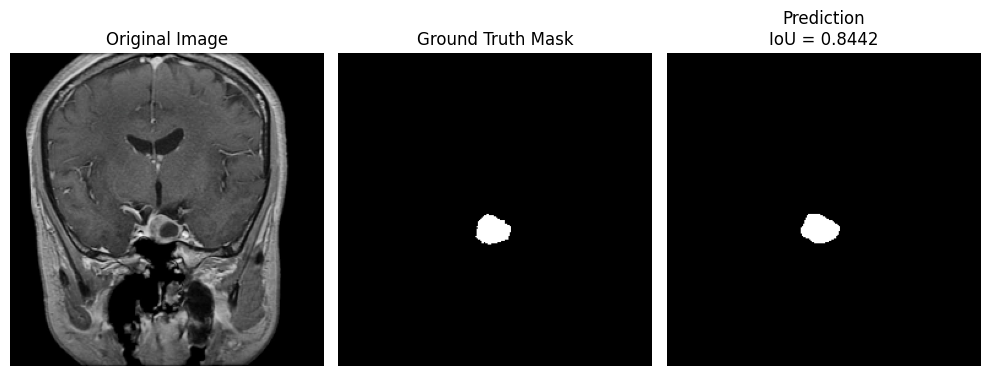

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


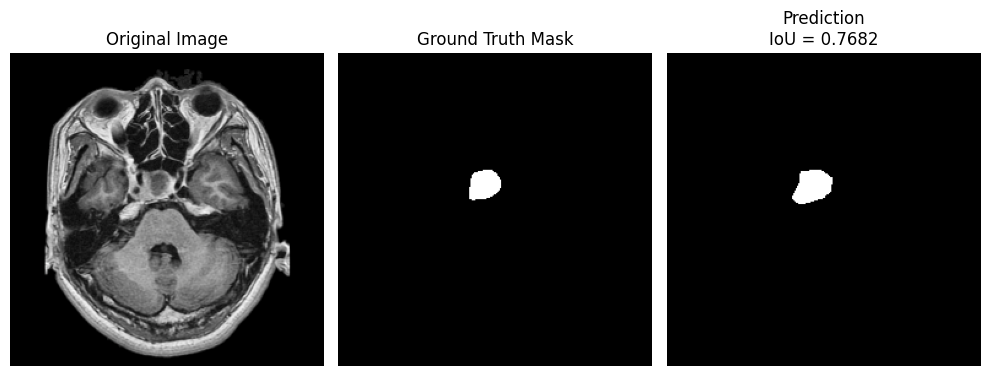

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


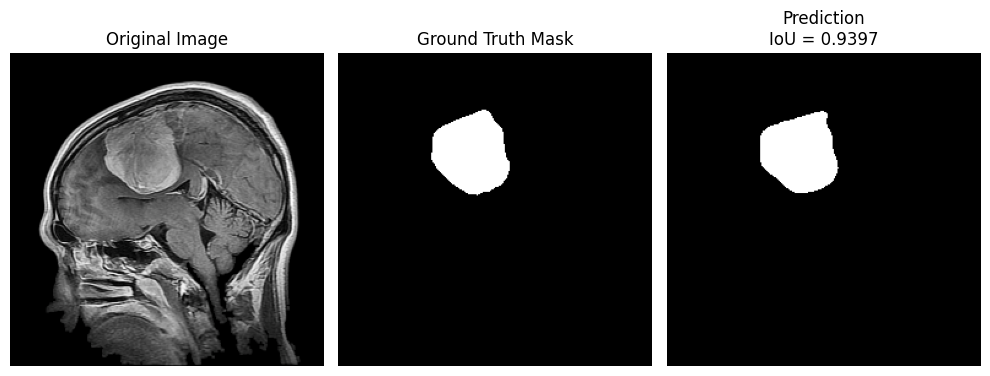

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


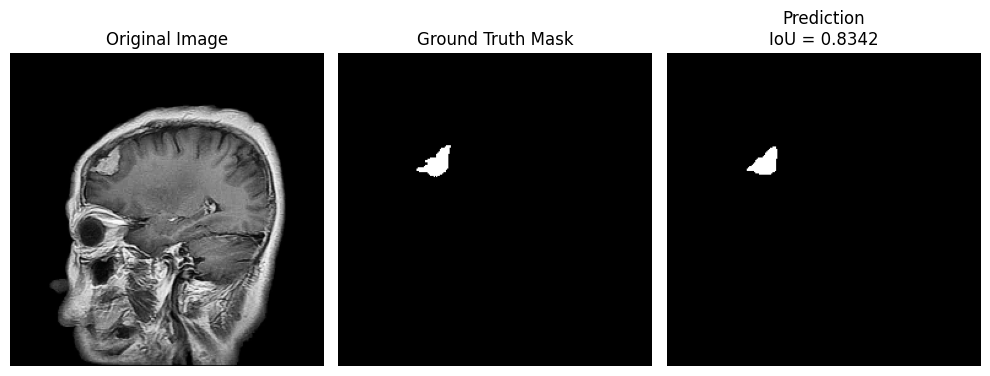

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


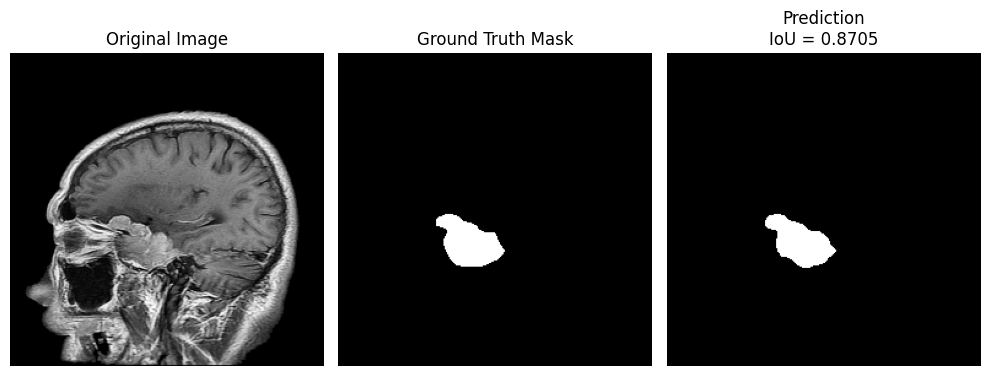

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


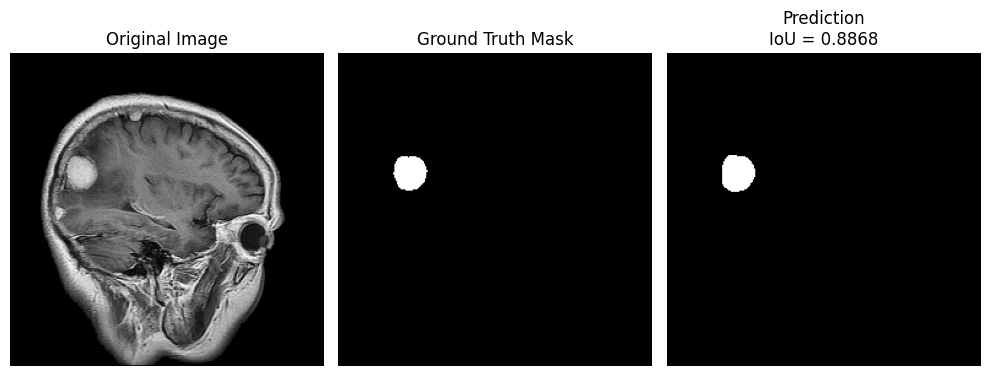

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


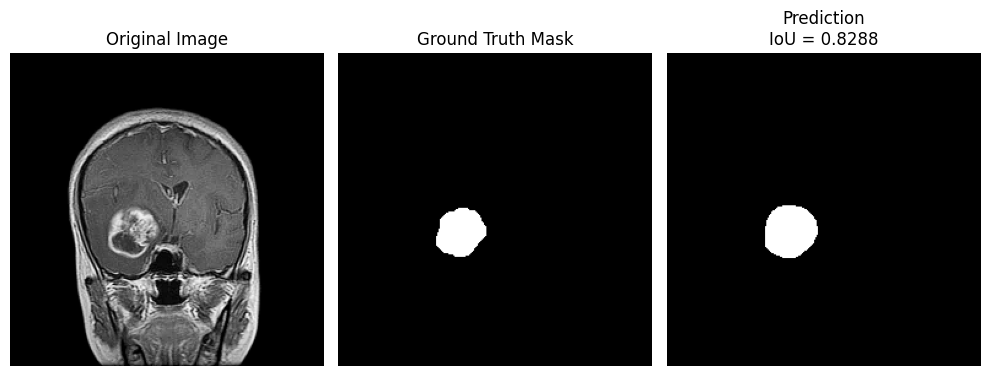

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


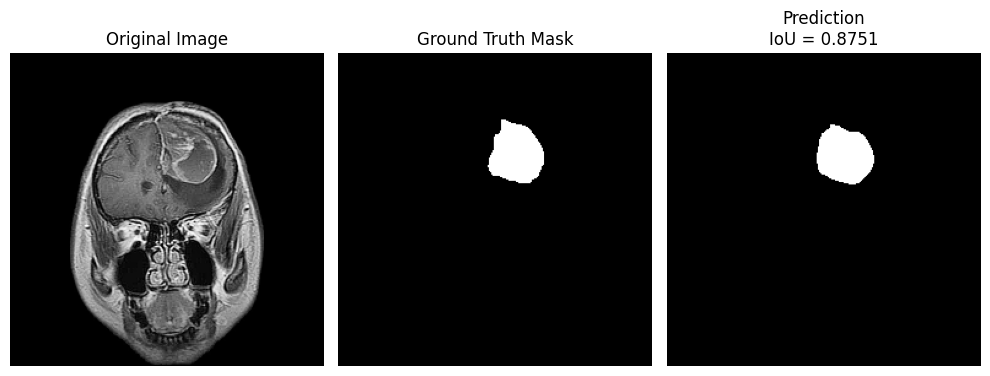

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


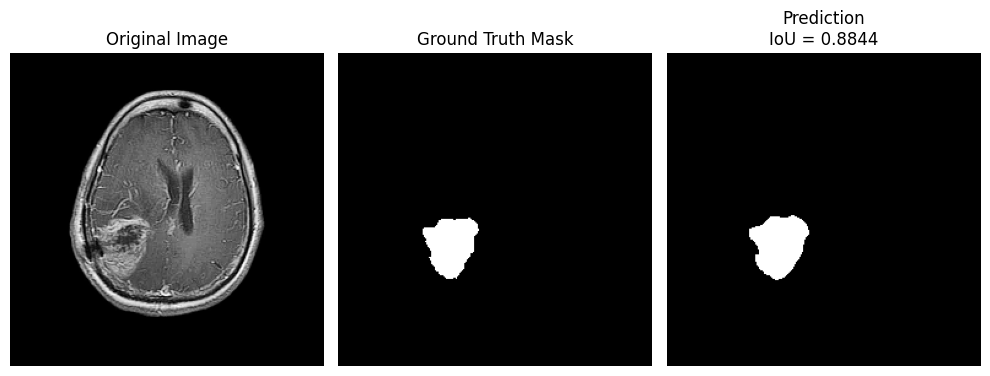

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


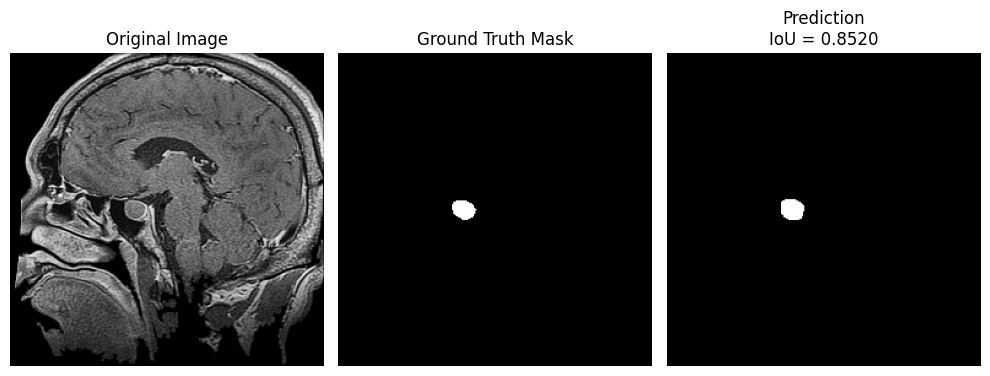

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


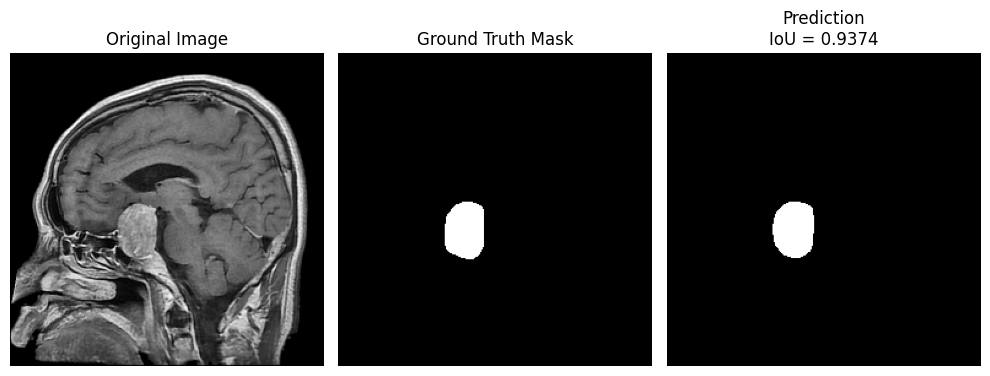

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


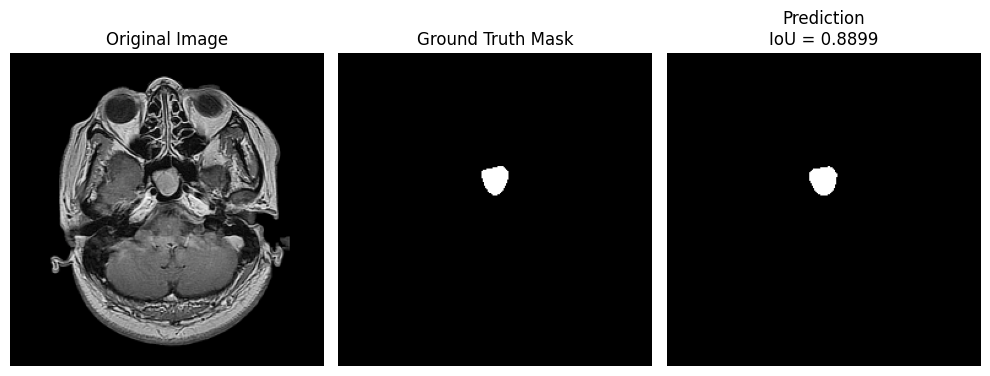

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


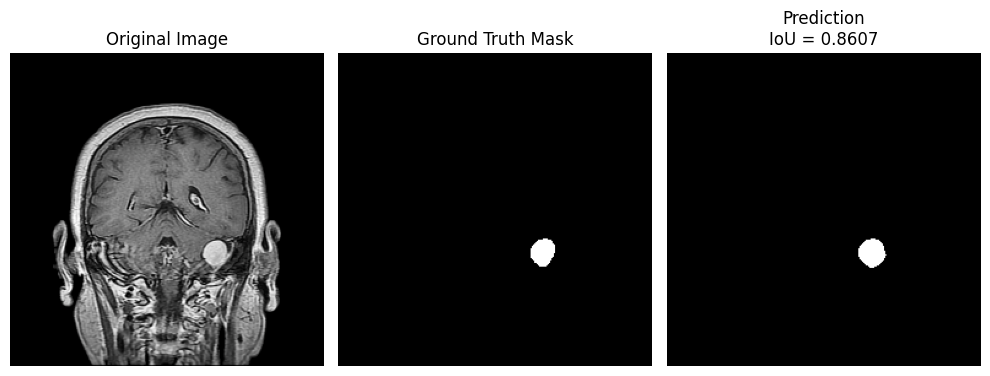

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


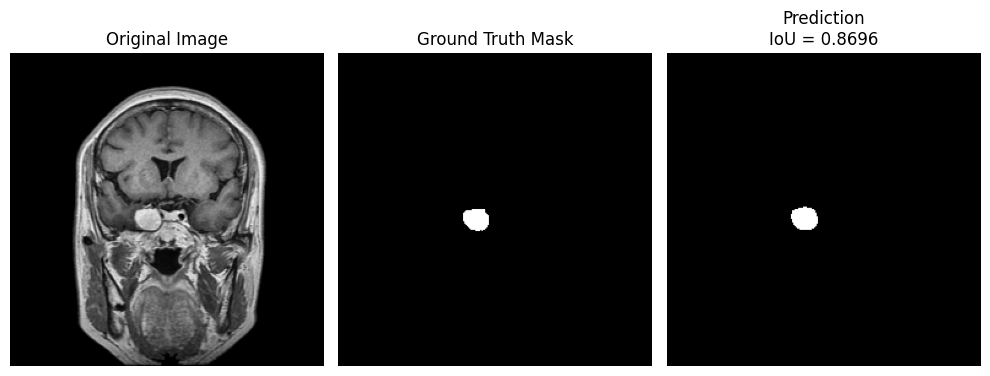

In [24]:
preprocess_input = sm.get_preprocessing('seresnet50')

iou_metric = sm.metrics.IOUScore(threshold=0.5)

for _ in range(50):
    index = np.random.randint(1, len(test_df.index))

    img = cv2.imread(test_df['image_paths'].iloc[index])
    img = cv2.resize(img, (256, 256))

    mask = cv2.imread(test_df['mask_paths'].iloc[index], cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (256, 256))
    mask = (mask > 127).astype(np.float32)

    img_norm = preprocess_input(img)
    img_norm = img_norm[np.newaxis, :, :, :]
    mask_exp = mask[np.newaxis, :, :, np.newaxis]

    predicted = model.predict(img_norm)[0, :, :, 0]
    predicted_bin = (predicted > 0.5).astype(np.float32)
    iou_score = iou_metric(mask_exp, predicted_bin[np.newaxis, :, :, np.newaxis]).numpy()

    plt.figure(figsize=(10, 15))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(mask, cmap='gray')
    plt.axis('off')
    plt.title('Ground Truth Mask')

    plt.subplot(1, 3, 3)
    plt.imshow(predicted_bin, cmap='gray')
    plt.axis('off')
    plt.title(f'Prediction\nIoU = {iou_score:.4f}')

    plt.tight_layout()
    plt.show()